#importing libraries

In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split as tts
from sklearn.datasets import fetch_olivetti_faces
from sklearn.cluster import DBSCAN
import random

#Problem 1

##Part 1



In [ ]:
df=pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/glass/glass.data',names=["ID","RI","Na","Mg","Al","Si","K","Ca","Ba","Fe","Type"])
df.head()

,ID,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0,0.0,1
1,2,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0,0.0,1
2,3,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0,0.0,1
3,4,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0,0.0,1
4,5,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0,0.0,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214 entries, 0 to 213
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      214 non-null    int64  
 1   RI      214 non-null    float64
 2   Na      214 non-null    float64
 3   Mg      214 non-null    float64
 4   Al      214 non-null    float64
 5   Si      214 non-null    float64
 6   K       214 non-null    float64
 7   Ca      214 non-null    float64
 8   Ba      214 non-null    float64
 9   Fe      214 non-null    float64
 10  Type    214 non-null    int64  
dtypes: float64(9), int64(2)
memory usage: 18.5 KB


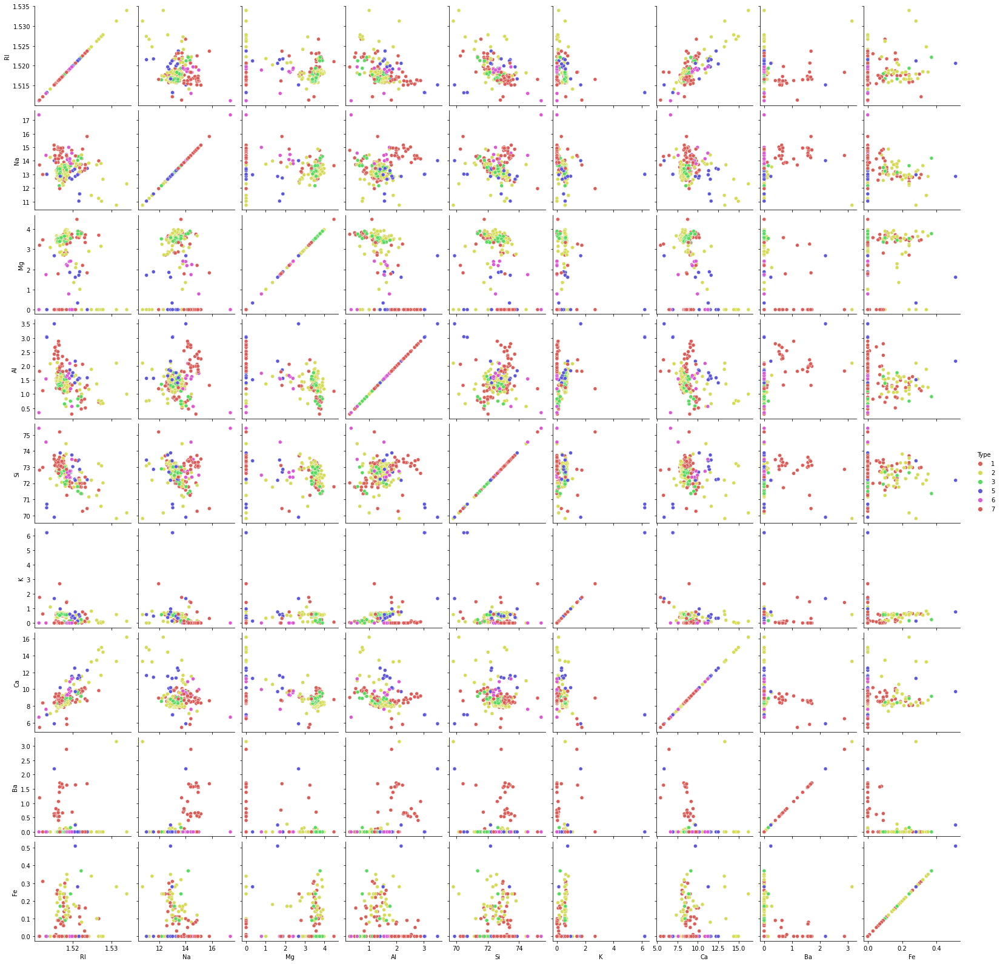

In [ ]:
sns.pairplot(data=df.drop('ID',axis=1),hue='Type',palette='hls',diag_kind=None)

In [ ]:
X=df.drop(['ID','Type'],axis=1)
y=df['Type']
model=KMeans(n_clusters=7,random_state=42)
model.fit(X)

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=7, random_state=42)

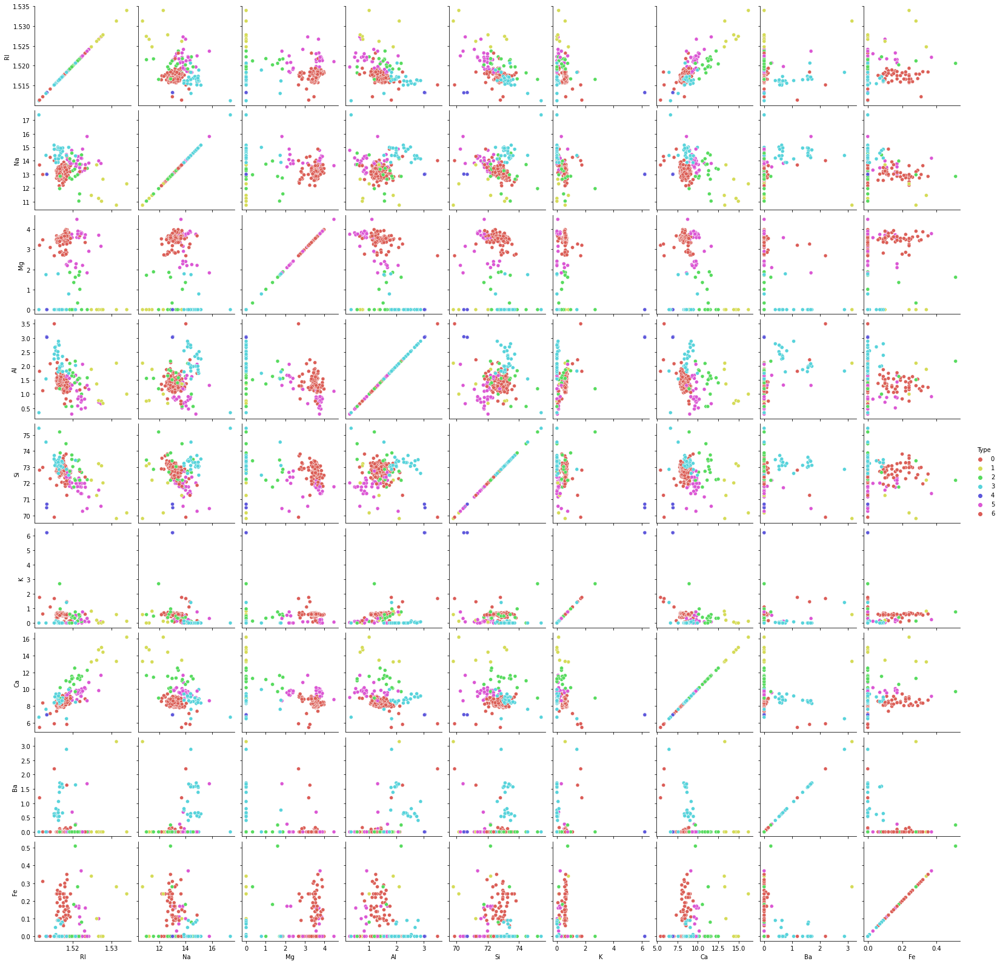

In [ ]:
y_pred=model.predict(X)
new_df=df.copy()
new_df['Type']=y_pred
sns.pairplot(data=new_df.drop('ID',axis=1),hue='Type',palette='hls',diag_kind=None)



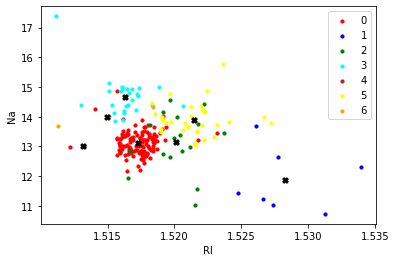

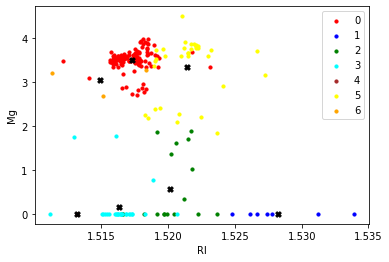

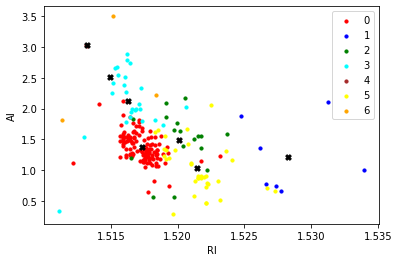

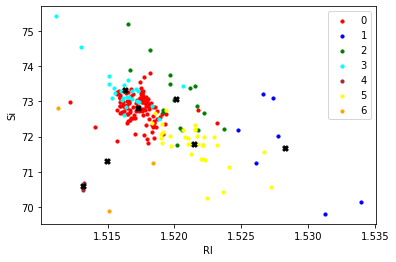

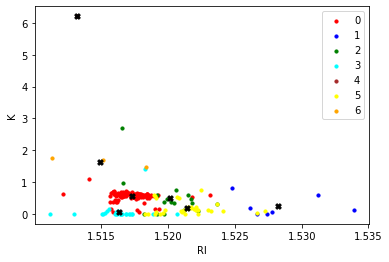

...

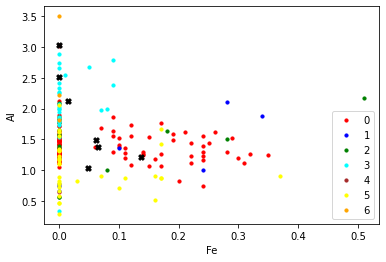

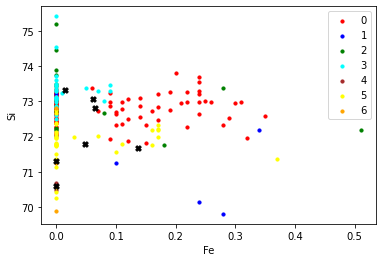

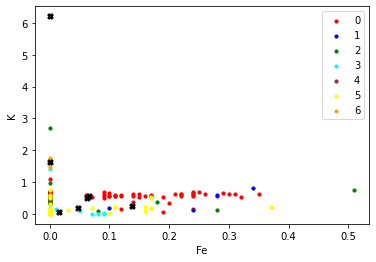

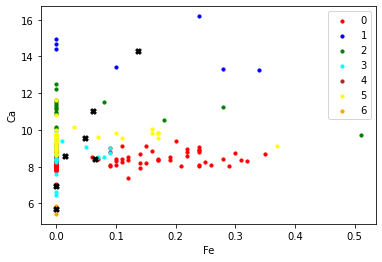

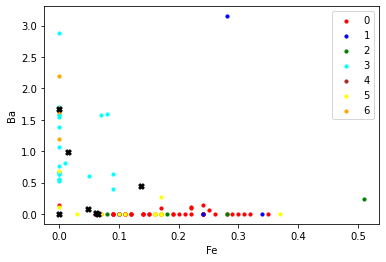

In [ ]:
color=['red','blue','green','cyan','brown','yellow','orange']
centeroids=model.cluster_centers_
for header_x in range(len(X.columns)):
    for header_y in range(len(X.columns)):
        if(header_x==header_y):
            continue
        for i in range(7):
            idx=np.where(y_pred==i)[0]
            
            plt.scatter(X.iloc[idx,header_x],X.iloc[idx,header_y],color=color[i],label=i,s=10)
        plt.scatter(centeroids[:,header_x],centeroids[:,header_y],marker='X',s=30,color='black')
        plt.xlabel(X.columns[header_x])
        plt.ylabel(X.columns[header_y])
        plt.legend()
        plt.show()




##Part 2

4


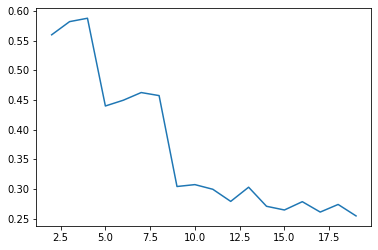

In [ ]:
Silhouette_scores=[]
for n_clusters in range(2,20):
    temp_model=KMeans(n_clusters=n_clusters,random_state=42)
    temp_model.fit(X)
    temp_y_pred=temp_model.predict(X)
    Silhouette_scores.append(silhouette_score(X,temp_y_pred))

# print(Silhouette_scores.argmax()+2)
plt.plot(range(2,20),Silhouette_scores)
argmx=Silhouette_scores.index(max(Silhouette_scores))
print(argmx+2)


##Part 3

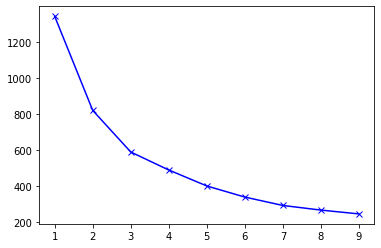

In [ ]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X)
    distortions.append(kmeanModel.inertia_)
plt.plot(K,distortions,'bx-')

##Part 4


In [ ]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.3,shuffle=True,random_state=42)

In [ ]:
for k in [1,2,3]:
    knn_model=KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train,y_train)
    print('accuracy of single knn model on k=',k,'is',knn_model.score(X_test,y_test))

    knn=KNeighborsClassifier(n_neighbors=k)
    Bagg_clf=BaggingClassifier(estimator=knn,n_estimators=10)
    Bagg_clf.fit(X_train,y_train)
    print('accuracy of bagging classifier on k=',k,'is',Bagg_clf.score(X_test,y_test))

accuracy of single knn model on k= 1 is 0.7692307692307693
accuracy of bagging classifier on k= 1 is 0.7538461538461538
accuracy of single knn model on k= 2 is 0.6615384615384615
accuracy of bagging classifier on k= 2 is 0.7230769230769231
accuracy of single knn model on k= 3 is 0.6461538461538462
accuracy of bagging classifier on k= 3 is 0.676923076923077


#Problem 2

##Part 1


In [10]:
of = fetch_olivetti_faces()
df=pd.DataFrame(of.data)
df['Class']=of.target
df.isna().sum().sum()


downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


0

In [11]:
X=df.drop('Class',axis=1)
y=df['Class']

In [19]:
class KMeans_Scratch:
    def __init__(self,k,max_iter):
        self.k=k
        self.max_iter=max_iter

    def __distance(self,x,y):
        distance=(x-y)**2
        distance=np.sqrt(distance.sum())
        return distance

    def __assign_clusters(self,X,centroids):
        clusters=[]
        for _ in range(self.k):
            clusters.append([])
        for x in X:
            # print(x)
            distance=[]
            for centroid in centroids:
                distance.append(self.__distance(x,centroid))
            clusters[distance.index(min(distance))].append(x)
        return clusters
            
    def __update_centroids(self,clusters):
        means=[np.mean(cluster,axis=0) for cluster in clusters]
        return np.array(means)


    def train(self,X,ini_centroids):
        centroids=ini_centroids
        cnt=0
        for _ in range(self.max_iter):
            cnt+=1
            clusters=self.__assign_clusters(X,centroids)
            new_centroids=self.__update_centroids(clusters)
            if(np.all(new_centroids==centroids)):
                # print(centroids,new_centroids)
                break
            centroids=new_centroids
        # print('cnt',cnt)
        self.cluster_centers_=centroids
        self.clusters=self.__assign_clusters(X,centroids)

    def predict(self,x):
        distance=[]
        for centroid in self.cluster_centers_:
            distance.append(self.__distance(x,centroid))
        return distance.index(min(distance))

    def test(self,X):
        preds=[]
        for x in X:
            preds.append(self.predict(x))
        return preds

    


idx=np.random.choice(400,40,replace=False)
# print(X)
init_centroids=X.iloc[idx,:].to_numpy()
clf=KMeans_Scratch(40,1000)
clf.train(X.to_numpy(),init_centroids)
clusters=clf.clusters
no_of_datapoints_in_cluster=[]
for cluster in clusters:
    no_of_datapoints_in_cluster.append(len(cluster))
print(no_of_datapoints_in_cluster)







[17, 6, 10, 6, 5, 3, 5, 38, 16, 4, 22, 1, 6, 3, 17, 18, 6, 7, 14, 6, 10, 16, 2, 11, 27, 15, 3, 7, 2, 13, 11, 10, 20, 1, 8, 5, 10, 4, 8, 7]


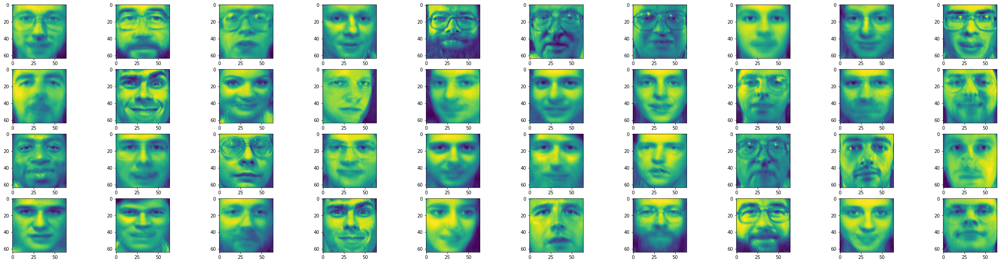

In [20]:
idx=1
plt.rcParams['figure.figsize'] = [40, 10]
for x in clf.cluster_centers_:
    plt.subplot(4,10,idx)
    idx+=1
    plt.imshow(x.reshape(64,64))
plt.show()

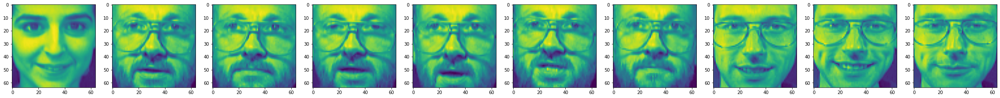

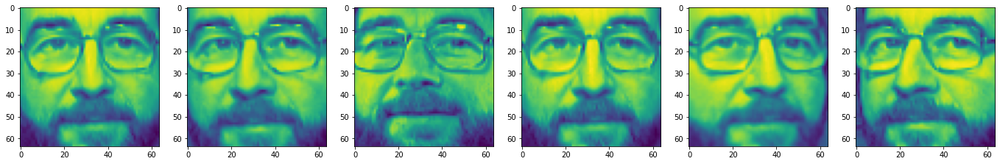

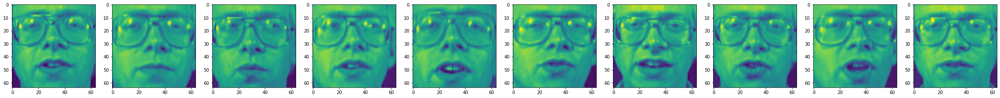

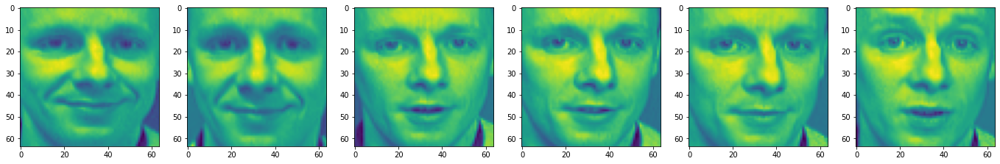

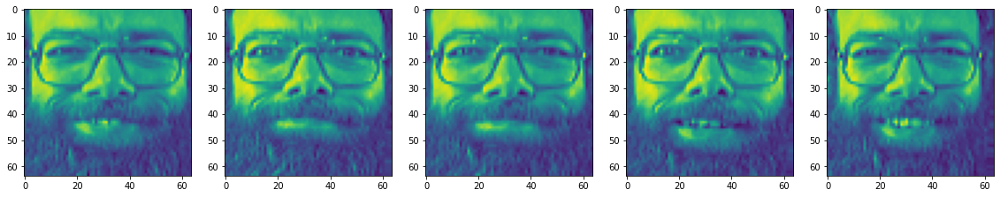

...

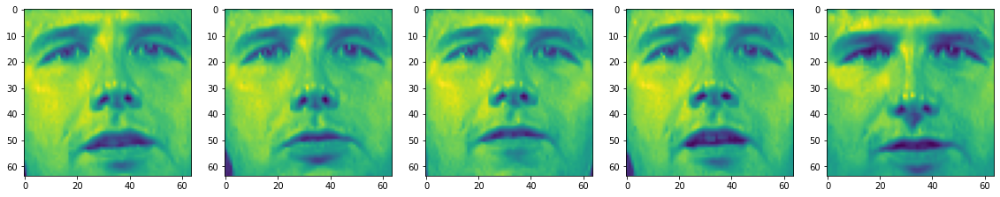

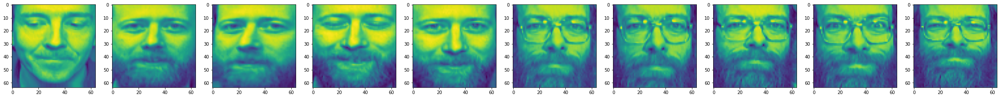

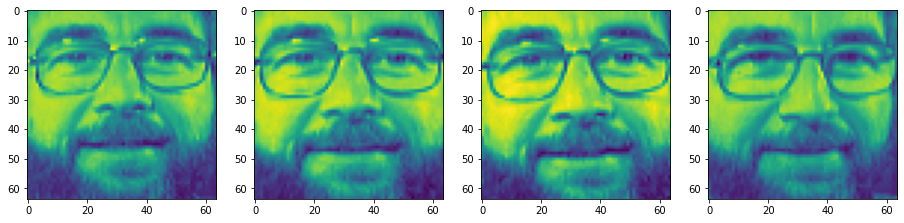

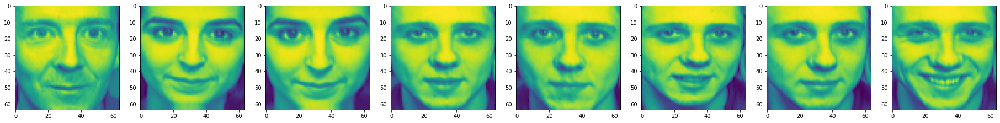

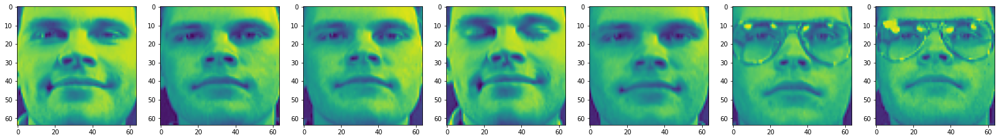

In [21]:
plt.rcParams['figure.figsize'] = [40, 10]
for cluster in clf.clusters:
    for i in range(min(10,len(cluster))):
        plt.subplot(1,10,i+1)
        plt.imshow(cluster[i].reshape(64,64))
    plt.show()
        
        

In [17]:
init_cluster_means=[]
for i in range(40):
    idx=np.where(y==i)[0]
    init_cluster_means.append(random.choice(idx))
clf2=KMeans(n_clusters=40,init=X.iloc[init_cluster_means,:])
clf2.fit(X)

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:1362: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(init=         0         1         2         3         4         5         6     \
5    0.549587  0.545455  0.541322  0.537190  0.537190  0.533058  0.528926   
17   0.586777  0.595041  0.681818  0.694215  0.714876  0.698347  0.714876   
27   0.173554  0.161157  0.161157  0.252066  0.363636  0.454545  0.524793   
37   0.103306  0.219008  0.177686  0.219008  0.392562  0.574380  0.669421   
45   0.338843  0.404959  0.508264  0.524793  0.578512  0.623967  0.652893   
59   0.553719  0.607438  0.636364  0.648760  0.65289...
341  0.652893  0.685950  0.714876  0.723140  0.706612  0.681818  0.549587  
351  0.623967  0.669421  0.698347  0.719008  0.706612  0.739669  0.772727  
363  0.128099  0.144628  0.157025  0.194215  0.190083  0.194215  0.198347  
373  0.289256  0.239669  0.400826  0.404959  0.293388  0.285124  0.268595  
388  0.123967  0.148760  0.177686  0.227273  0.231405  0.342975  0.450413  
397  0.161157  0.161157  0.173554  0.157025  0.177686  0.148760  0.190083  

[40 rows x 4096 columns],
       n_clusters=40)

In [ ]:
cluster_means=clf2.clus

In [22]:




def distance(x,y):
        distance=(x-y)**2
        return distance.sum()

def sse(clf,X):
    cluster_means=clf.cluster_centers_
    # cluster_means=clf.centroids
    sum=0
    
    for x in X:
        # print(x)
        y=clf.predict(x.reshape(1,-1))
        sum+=distance(x,cluster_means[y])
    return sum

print(sse(clf,X.to_numpy()))

print(sse(clf2,X.to_numpy()))



12695.381666660309
12139.339257240295


#Problem 03

In [2]:
df=pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/00292/Wholesale%20customers%20data.csv')
df

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185
...,...,...,...,...,...,...,...,...
435,1,3,29703,12051,16027,13135,182,2204
436,1,3,39228,1431,764,4510,93,2346
437,2,3,14531,15488,30243,437,14841,1867
438,1,3,10290,1981,2232,1038,168,2125


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Channel           440 non-null    int64
 1   Region            440 non-null    int64
 2   Fresh             440 non-null    int64
 3   Milk              440 non-null    int64
 4   Grocery           440 non-null    int64
 5   Frozen            440 non-null    int64
 6   Detergents_Paper  440 non-null    int64
 7   Delicassen        440 non-null    int64
dtypes: int64(8)
memory usage: 27.6 KB


In [4]:
df=(df-df.min())/(df.max()-df.min())
df

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,1.0,1.0,0.112940,0.130727,0.081464,0.003106,0.065427,0.027847
1,1.0,1.0,0.062899,0.132824,0.103097,0.028548,0.080590,0.036984
2,1.0,1.0,0.056622,0.119181,0.082790,0.039116,0.086052,0.163559
3,0.0,1.0,0.118254,0.015536,0.045464,0.104842,0.012346,0.037234
4,1.0,1.0,0.201626,0.072914,0.077552,0.063934,0.043455,0.108093
...,...,...,...,...,...,...,...,...
435,0.0,1.0,0.264829,0.163338,0.172715,0.215469,0.004385,0.045912
436,0.0,1.0,0.349761,0.018736,0.008202,0.073713,0.002205,0.048874
437,1.0,1.0,0.129543,0.210136,0.325943,0.006771,0.363463,0.038882
438,0.0,1.0,0.091727,0.026224,0.024025,0.016649,0.004042,0.044264


<AxesSubplot:>

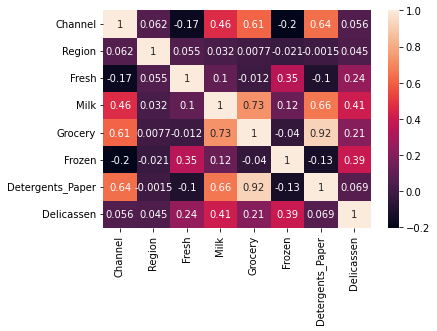

In [5]:
sns.heatmap(df.corr(),annot=True)

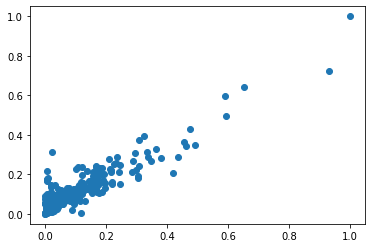

In [6]:
plt.scatter(df['Detergents_Paper'],df['Grocery'])

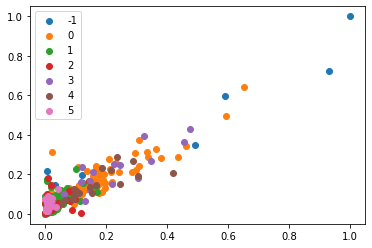

In [8]:
dbscan_clf=DBSCAN().fit(df.to_numpy())
y=dbscan_clf.labels_
for i in np.unique(y):
    idx=np.where(y==i)[0]
    plt.scatter(df['Detergents_Paper'][idx],df['Grocery'][idx],label=i)
plt.legend()
plt.show()

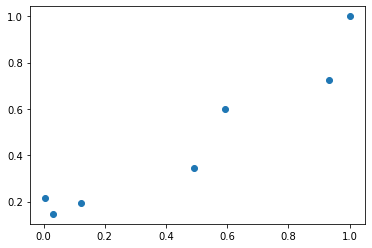

In [9]:
idx=np.where(y==-1)[0]
plt.scatter(df['Detergents_Paper'][idx],df['Grocery'][idx])